In [1]:
import os
import math
import random
from pathlib import Path

import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt

from PIL import Image
from matplotlib.patches import Rectangle
from pathlib import Path

In [11]:
# =========================
# User configuration
# =========================

LABELS_CSV = "/home/woody/iwi5/iwi5362h/data/vindr_cxr/annotations/image_labels_test.csv"
IMAGES_ROOT = "/home/woody/iwi5/iwi5362h/data/vindr_cxr/test"

HEATMAPS_DIR = "/home/vault/iwi5/iwi5362h/results/heatmaps_itc/original"
BOX_ANNOTATIONS_CSV = (
    "/home/woody/iwi5/iwi5362h/data/vindr_cxr/annotations/"
    "annotations_test.csv"
)
TEST_META_CSV = "/home/woody/iwi5/iwi5362h/data/vindr_cxr/test_meta.csv" 

# Optional:
# For masked views set VIEW_TYPE to "lung" or "heart" and provide MASK_ROOT.
# For original CXR view, keep VIEW_TYPE = "original" and MASK_ROOT = None.
VIEW_TYPE = "original"   # "original", "lung", or "heart"
MASK_ROOT = None         # e.g. "/home/woody/iwi5/iwi5362h/data/vindr_cxr/chexmask_mask_cache/test/heart"

TARGET_LABEL = "Cardiomegaly"
CAM_KEY = "cam_vis_up"   # common options: "cam_vis_up", "cam_vis", "cam_raw"

NUM_POS = 10
NUM_NEG = 10
RANDOM_SEED = 42

# Notebook display size
ROW_HEIGHT = 3.2
FIG_DPI = 140

# Save output?
SAVE_PNG = True
OUTPUT_PNG_PARENT = "/home/vault/iwi5/iwi5362h/results/multiview/visualization/original/"
OUTPUT_PNG = f"{OUTPUT_PNG_PARENT}/cardiomegaly_10pos_10neg_attention_grid.png"

# Optional CSV of the selected cases
SAVE_SELECTED_CSV = True
SELECTED_CSV = "/home/vault/iwi5/iwi5362h/results/multiview/visualization/original//cardiomegaly_10pos_10neg_selected_cases.csv"

In [12]:
def shard_mask_path(mask_root, image_id):
    return os.path.join(mask_root, image_id[:2], f"{image_id}.png")


def load_image(image_id, images_root, view_type="original", mask_root=None):
    img_path = os.path.join(images_root, f"{image_id}.png")
    img = Image.open(img_path).convert("RGB")

    if view_type in {"lung", "heart"}:
        if mask_root is None:
            raise ValueError(f"MASK_ROOT must be provided for view_type='{view_type}'")
        mask_path = shard_mask_path(mask_root, image_id)
        mask = Image.open(mask_path).convert("L")
        if img.size != mask.size:
            raise ValueError(f"Image/mask size mismatch for {image_id}: {img.size} vs {mask.size}")
        black = Image.new("RGB", img.size, (0, 0, 0))
        img = Image.composite(img, black, mask)

    return img


def normalize_map(cam):
    cam = np.asarray(cam, dtype=np.float32)
    cam = np.nan_to_num(cam, nan=0.0, posinf=0.0, neginf=0.0)
    mn, mx = cam.min(), cam.max()
    if mx > mn:
        cam = (cam - mn) / (mx - mn)
    else:
        cam = np.zeros_like(cam, dtype=np.float32)
    return cam


def resize_cam_to_image(cam, image_size_wh):
    w, h = image_size_wh

    cam = np.asarray(cam, dtype=np.float32).squeeze()
    cam = np.nan_to_num(cam, nan=0.0, posinf=1.0, neginf=0.0)
    cam = np.clip(cam, 0.0, 1.0)

    if cam.shape != (h, w):
        cam_img = Image.fromarray(
            (cam * 255).round().astype(np.uint8)
        )
        cam_img = cam_img.resize(
            (w, h),
            resample=Image.Resampling.BILINEAR,
        )
        cam = np.asarray(cam_img, dtype=np.float32) / 255.0

    return cam


def make_overlay(rgb_img, cam_norm, alpha=0.45, cmap_name="jet"):
    """
    rgb_img: H x W x 3 in [0,1]
    cam_norm: H x W in [0,1]
    """
    cmap = plt.get_cmap(cmap_name)
    heat_rgb = cmap(cam_norm)[..., :3]   # drop alpha
    overlay = (1 - alpha) * rgb_img + alpha * heat_rgb
    overlay = np.clip(overlay, 0, 1)
    return overlay


def find_heatmap_index(heatmaps_dir):
    heatmaps_dir = Path(heatmaps_dir)
    index_csv = heatmaps_dir / "albef_itc_gradcam_index.csv"

    mapping = {}

    if index_csv.is_file():
        idx = pd.read_csv(index_csv)

        required = {"image_id", "heatmap_path"}
        missing = required - set(idx.columns)
        if missing:
            raise KeyError(
                f"{index_csv} is missing columns: {sorted(missing)}"
            )

        for _, row in idx.iterrows():
            image_id = str(row["image_id"])
            pt_path = Path(str(row["heatmap_path"]))

            if not pt_path.is_absolute():
                pt_path = heatmaps_dir / pt_path

            if not pt_path.is_file():
                raise FileNotFoundError(
                    f"Indexed heatmap does not exist: {pt_path}"
                )

            if image_id in mapping:
                raise ValueError(
                    f"Duplicate heatmap mapping for image_id={image_id}"
                )

            mapping[image_id] = str(pt_path)

        return mapping

    for pt_path in sorted(heatmaps_dir.glob("*.pt")):
        image_id = pt_path.stem
        if image_id in mapping:
            raise ValueError(f"Duplicate .pt file for image_id={image_id}")
        mapping[image_id] = str(pt_path)

    return mapping


def load_cam_from_pt(
    pt_path,
    target_label,
    cam_key="cam_vis_up",
):
    try:
        obj = torch.load(
            pt_path,
            map_location="cpu",
            weights_only=False,
        )
    except TypeError:
        obj = torch.load(pt_path, map_location="cpu")

    if not isinstance(obj, dict):
        raise TypeError(
            f"Expected a dictionary in {pt_path}, got {type(obj)}"
        )

    metadata = obj.get("__metadata__", {})

    expected_method = (
        "standard_albef_itc_final_self_attention_gradcam"
    )
    actual_method = metadata.get("method")

    if actual_method != expected_method:
        raise ValueError(
            f"Wrong heatmap method in {pt_path}: "
            f"expected {expected_method!r}, got {actual_method!r}"
        )

    if metadata.get("uses_negative_prompt") is not False:
        raise ValueError(
            f"{pt_path} is not a positive-similarity-only ITC map"
        )

    if target_label not in obj:
        raise KeyError(
            f"{target_label!r} not found in {pt_path}. "
            f"Available finding keys: "
            f"{[k for k in obj if k != '__metadata__']}"
        )

    finding = obj[target_label]

    expected_prompt = target_label.replace("_", " ").strip()
    actual_prompt = finding.get("prompt")

    if actual_prompt != expected_prompt:
        raise ValueError(
            f"Prompt mismatch in {pt_path}: "
            f"requested {expected_prompt!r}, stored {actual_prompt!r}"
        )

    if cam_key not in finding:
        raise KeyError(
            f"{cam_key!r} absent for {target_label!r} in {pt_path}. "
            f"Available keys: {list(finding)}"
        )

    cam = finding[cam_key]
    if torch.is_tensor(cam):
        cam = cam.detach().cpu().float().numpy()

    cam = np.asarray(cam, dtype=np.float32).squeeze()

    if cam.ndim != 2:
        raise ValueError(
            f"Expected a 2-D CAM, got shape {cam.shape}"
        )

    if not np.isfinite(cam).all():
        raise ValueError(f"CAM contains NaN or Inf values: {pt_path}")

    return cam, finding, metadata

def prepare_test_meta(meta_csv):
    meta = pd.read_csv(meta_csv)
    meta.columns = [str(c).strip() for c in meta.columns]

    width_col = next(
        (
            c for c in ["width", "W", "image_width", "dim1"]
            if c in meta.columns
        ),
        None,
    )

    height_col = next(
        (
            c for c in ["height", "H", "image_height", "dim0"]
            if c in meta.columns
        ),
        None,
    )

    if "image_id" not in meta.columns:
        raise KeyError(
            f"'image_id' not found in test metadata. "
            f"Available columns: {meta.columns.tolist()}"
        )

    if width_col is None or height_col is None:
        raise KeyError(
            "Could not identify width and height columns in test metadata.\n"
            f"Available columns: {meta.columns.tolist()}"
        )

    meta = meta.rename(
        columns={
            width_col: "annotation_width",
            height_col: "annotation_height",
        }
    ).copy()

    meta["image_id"] = (
        meta["image_id"]
        .astype(str)
        .str.replace(".png", "", regex=False)
        .str.replace(".jpg", "", regex=False)
        .str.replace(".jpeg", "", regex=False)
    )

    meta["annotation_width"] = pd.to_numeric(
        meta["annotation_width"],
        errors="coerce",
    )

    meta["annotation_height"] = pd.to_numeric(
        meta["annotation_height"],
        errors="coerce",
    )

    meta = meta.dropna(
        subset=[
            "image_id",
            "annotation_width",
            "annotation_height",
        ]
    )

    meta = meta.drop_duplicates(
        subset=["image_id"],
        keep="first",
    )

    return meta[
        [
            "image_id",
            "annotation_width",
            "annotation_height",
        ]
    ].copy()

def get_scaled_gt_boxes(
    image_id,
    box_annotations_df,
    meta_lookup,
    displayed_width,
    displayed_height,
    class_name="Cardiomegaly",
):
    """
    Load GT boxes in annotation coordinates and scale them to the
    dimensions of the image currently displayed by matplotlib.

    Annotation coordinate system:
        test_meta.csv width x height

    Display coordinate system:
        img_pil.size
    """
    image_id = str(image_id)

    if image_id not in meta_lookup:
        raise KeyError(
            f"No test_meta.csv entry found for image_id={image_id}"
        )

    annotation_width = float(
        meta_lookup[image_id]["annotation_width"]
    )
    annotation_height = float(
        meta_lookup[image_id]["annotation_height"]
    )

    if annotation_width <= 0 or annotation_height <= 0:
        raise ValueError(
            f"Invalid metadata dimensions for {image_id}: "
            f"{annotation_width} x {annotation_height}"
        )

    scale_x = displayed_width / annotation_width
    scale_y = displayed_height / annotation_height

    selected = box_annotations_df[
        (box_annotations_df["image_id"] == image_id)
        &
        (
            box_annotations_df["class_name"].str.casefold()
            == class_name.casefold()
        )
    ]

    scaled_boxes = []

    for _, annotation in selected.iterrows():
        x_min = float(annotation["x_min"]) * scale_x
        y_min = float(annotation["y_min"]) * scale_y
        x_max = float(annotation["x_max"]) * scale_x
        y_max = float(annotation["y_max"]) * scale_y

        # Clip to displayed image boundaries
        x_min = np.clip(x_min, 0, displayed_width - 1)
        x_max = np.clip(x_max, 0, displayed_width - 1)
        y_min = np.clip(y_min, 0, displayed_height - 1)
        y_max = np.clip(y_max, 0, displayed_height - 1)

        if x_max <= x_min or y_max <= y_min:
            continue

        scaled_boxes.append(
            (
                float(x_min),
                float(y_min),
                float(x_max),
                float(y_max),
            )
        )

    scaling_info = {
        "annotation_width": annotation_width,
        "annotation_height": annotation_height,
        "displayed_width": displayed_width,
        "displayed_height": displayed_height,
        "scale_x": scale_x,
        "scale_y": scale_y,
    }

    return scaled_boxes, scaling_info


def draw_gt_boxes(
    class_name,
    ax,
    boxes,
    image_width,
    image_height,
    linewidth=2.5,
):
    """
    Draw GT bounding boxes on a matplotlib axis.

    Coordinates are clipped to the displayed image dimensions.
    """
    for box_index, (x_min, y_min, x_max, y_max) in enumerate(boxes):
        x_min = np.clip(x_min, 0, image_width - 1)
        x_max = np.clip(x_max, 0, image_width - 1)
        y_min = np.clip(y_min, 0, image_height - 1)
        y_max = np.clip(y_max, 0, image_height - 1)

        width = max(0.0, x_max - x_min)
        height = max(0.0, y_max - y_min)

        if width == 0 or height == 0:
            continue

        rectangle = Rectangle(
            (x_min, y_min),
            width,
            height,
            fill=False,
            edgecolor="lime",
            linewidth=linewidth,
        )

        ax.add_patch(rectangle)

        # Add the label only to the first GT box
        if box_index == 0:
            ax.text(
                x_min,
                max(0, y_min - 8),
                f"GT {class_name}",
                color="lime",
                fontsize=8,
                fontweight="bold",
                bbox={
                    "facecolor": "black",
                    "alpha": 0.55,
                    "edgecolor": "none",
                    "pad": 1.5,
                },
            )


def prepare_box_annotations(csv_path):
    """
    Load and standardize the VinDr bounding-box annotation CSV.

    Required information:
        image_id
        class_name
        x_min
        y_min
        x_max
        y_max
    """
    df = pd.read_csv(csv_path)

    # Case-insensitive lookup of existing columns
    lower_to_original = {str(col).lower(): col for col in df.columns}

    possible_names = {
        "image_id": ["image_id", "imageid", "image"],
        "class_name": ["class_name", "classname", "class", "finding", "label"],
        "x_min": ["x_min", "xmin", "x1"],
        "y_min": ["y_min", "ymin", "y1"],
        "x_max": ["x_max", "xmax", "x2"],
        "y_max": ["y_max", "ymax", "y2"],
    }

    rename_map = {}

    for standard_name, candidates in possible_names.items():
        found = None

        for candidate in candidates:
            if candidate.lower() in lower_to_original:
                found = lower_to_original[candidate.lower()]
                break

        if found is None:
            raise KeyError(
                f"Could not find a column corresponding to '{standard_name}'.\n"
                f"Available columns: {df.columns.tolist()}"
            )

        rename_map[found] = standard_name

    df = df.rename(columns=rename_map).copy()

    # Ensure image IDs match the heatmap/image IDs
    df["image_id"] = (
        df["image_id"]
        .astype(str)
        .str.replace(".png", "", regex=False)
        .str.replace(".jpg", "", regex=False)
        .str.replace(".jpeg", "", regex=False)
    )

    df["class_name"] = df["class_name"].astype(str)

    coordinate_columns = ["x_min", "y_min", "x_max", "y_max"]

    for column in coordinate_columns:
        df[column] = pd.to_numeric(df[column], errors="coerce")

    # Remove malformed rows
    df = df.dropna(
        subset=[
            "image_id",
            "class_name",
            "x_min",
            "y_min",
            "x_max",
            "y_max",
        ]
    )

    # Remove exact duplicate boxes
    df = df.drop_duplicates(
        subset=[
            "image_id",
            "class_name",
            "x_min",
            "y_min",
            "x_max",
            "y_max",
        ]
    )

    return df

In [13]:
random.seed(RANDOM_SEED)
np.random.seed(RANDOM_SEED)

labels_df = pd.read_csv(LABELS_CSV)
box_annotations_df = prepare_box_annotations(BOX_ANNOTATIONS_CSV)
test_meta_df = prepare_test_meta(TEST_META_CSV)

meta_lookup = (
    test_meta_df
    .set_index("image_id")[
        ["annotation_width", "annotation_height"]
    ]
    .to_dict("index")
)

print(f"Loaded {len(box_annotations_df)} annotation rows")
print(f"Loaded metadata for {len(test_meta_df)} images")

if "image_id" not in labels_df.columns:
    raise KeyError(f"'image_id' column not found in {LABELS_CSV}")

if TARGET_LABEL not in labels_df.columns:
    raise KeyError(
        f"'{TARGET_LABEL}' column not found in labels CSV.\n"
        f"Available columns: {labels_df.columns.tolist()}"
    )

# Build image_id -> heatmap .pt path
heatmap_map = find_heatmap_index(HEATMAPS_DIR)
print(f"Found {len(heatmap_map)} heatmap files/mappings.")

# Keep only images that also have a heatmap file
labels_df = labels_df.copy()
labels_df["image_id"] = labels_df["image_id"].astype(str)
labels_df["has_heatmap"] = labels_df["image_id"].isin(heatmap_map.keys())
usable_df = labels_df[labels_df["has_heatmap"]].copy()

print(f"Usable images with heatmaps: {len(usable_df)}")
print(usable_df[TARGET_LABEL].value_counts(dropna=False))

Loaded 2697 annotation rows
Loaded metadata for 3000 images
Found 3000 heatmap files/mappings.
Usable images with heatmaps: 3000
0    2691
1     309
Name: Cardiomegaly, dtype: int64


In [14]:
# Treat 1 as positive, 0 as negative
pos_df = usable_df[usable_df[TARGET_LABEL] == 1].copy()
neg_df = usable_df[usable_df[TARGET_LABEL] == 0].copy()

print(f"Available positive cases: {len(pos_df)}")
print(f"Available negative cases: {len(neg_df)}")

if len(pos_df) < NUM_POS:
    raise ValueError(f"Only {len(pos_df)} positive heatmaps found, but NUM_POS={NUM_POS}")

if len(neg_df) < NUM_NEG:
    raise ValueError(
        f"Only {len(neg_df)} negative heatmaps found, but NUM_NEG={NUM_NEG}.\n"
        "If you extracted heatmaps with a positive-only option, negative cases may not exist."
    )

selected_pos = pos_df.sample(NUM_POS, random_state=RANDOM_SEED).copy()
selected_pos["case_type"] = "Positive"

selected_neg = neg_df.sample(NUM_NEG, random_state=RANDOM_SEED).copy()
selected_neg["case_type"] = "Negative"

selected_df = pd.concat([selected_pos, selected_neg], axis=0).reset_index(drop=True)

# Sort so positives appear first, then negatives
selected_df["case_order"] = selected_df["case_type"].map({"Positive": 0, "Negative": 1})
selected_df = selected_df.sort_values(["case_order", "image_id"]).reset_index(drop=True)

selected_df["heatmap_path"] = selected_df["image_id"].map(heatmap_map)

selected_df[["image_id", TARGET_LABEL, "case_type", "heatmap_path"]].head(20)

Available positive cases: 309
Available negative cases: 2691


,image_id,Cardiomegaly,case_type,heatmap_path
0,01eb30a37b6f5fed8a8d3ab2d1c0a7d6,1,Positive,/home/vault/iwi5/iwi5362h/results/heatmaps_itc...
1,439dc69a4c208bef639794335fc7e8aa,1,Positive,/home/vault/iwi5/iwi5362h/results/heatmaps_itc...
2,77fb399d095bb11d1344a1a114f59376,1,Positive,/home/vault/iwi5/iwi5362h/results/heatmaps_itc...
3,97f0ad3b3ccbfc848bf9cc7e1a76377c,1,Positive,/home/vault/iwi5/iwi5362h/results/heatmaps_itc...
4,9bd79ff85b40084060c327b2b9ca1e81,1,Positive,/home/vault/iwi5/iwi5362h/results/heatmaps_itc...
5,a2887b486dd81a8f4f9086a97b87ee44,1,Positive,/home/vault/iwi5/iwi5362h/results/heatmaps_itc...
6,a868475eb59e09a1fc9d6d5c12511d43,1,Positive,/home/vault/iwi5/iwi5362h/results/heatmaps_itc...
7,b7938de5b6940f45173e8f1e03b9396e,1,Positive,/home/vault/iwi5/iwi5362h/results/heatmaps_itc...
8,c4c6b6599a13c1c914b839f7a9f79540,1,Positive,/home/vault/iwi5/iwi5362h/results/heatmaps_itc...
9,d709c132746f0409128eaa1c87a9a274,1,Positive,/home/vault/iwi5/iwi5362h/results/heatmaps_itc...


In [7]:
selected_df.shape

(20, 33)

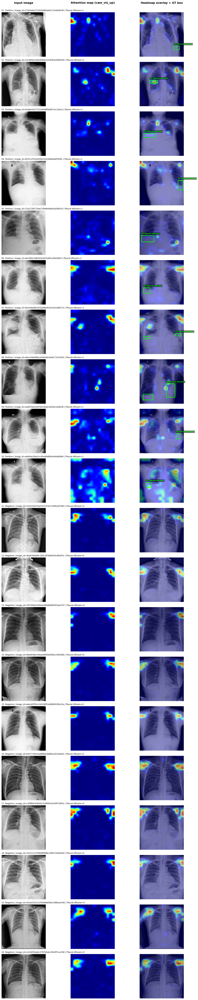

In [8]:
n_cases = len(selected_df)
n_cols = 3

fig_width = 14
fig_height = ROW_HEIGHT * n_cases

fig, axes = plt.subplots(
    nrows=n_cases,
    ncols=n_cols,
    figsize=(fig_width, fig_height),
    dpi=FIG_DPI,
)

if n_cases == 1:
    axes = np.expand_dims(axes, axis=0)


for i, (_, row) in enumerate(selected_df.iterrows()):
    image_id = str(row["image_id"])
    label_value = row[TARGET_LABEL]
    case_type = row["case_type"]
    pt_path = row["heatmap_path"]

    # -------------------------
    # Load input image
    # -------------------------
    img_pil = load_image(
        image_id=image_id,
        images_root=IMAGES_ROOT,
        view_type=VIEW_TYPE,
        mask_root=MASK_ROOT,
    )

    img_np = np.asarray(img_pil).astype(np.float32) / 255.0

    image_width, image_height = img_pil.size

    # -------------------------
    # Load attention map
    # -------------------------
    cam, finding_info, heatmap_metadata = load_cam_from_pt(
        pt_path,
        target_label=TARGET_LABEL,
        cam_key=CAM_KEY,
    )

    cam_resized = resize_cam_to_image(
        cam,
        img_pil.size,
    )

    # -------------------------
    # Create heatmap overlay
    # -------------------------
    overlay = make_overlay(
        rgb_img=img_np,
        cam_norm=cam_resized,
        alpha=0.45,
        cmap_name="jet",
    )

    # -------------------------
    # Retrieve GT boxes
    # Only for positive samples
    # -------------------------
    if case_type == "Positive":
        gt_boxes, scaling_info = get_scaled_gt_boxes(
            image_id=image_id,
            box_annotations_df=box_annotations_df,
            meta_lookup=meta_lookup,
            displayed_width=image_width,
            displayed_height=image_height,
            class_name=TARGET_LABEL,
        )
    else:
        gt_boxes = []
        scaling_info = None

    # ==================================================
    # Column 1: Original input image
    # ==================================================
    axes[i, 0].imshow(img_np)
    axes[i, 0].axis("off")

    row_title = (
        f"{i + 1:02d}. {case_type} | "
        f"image_id={image_id} | "
        f"{TARGET_LABEL}={label_value}"
    )

    axes[i, 0].set_title(
        row_title,
        fontsize=9,
        loc="left",
    )

    # ==================================================
    # Column 2: Attention map
    # ==================================================
    axes[i, 1].imshow(
        cam_resized,
        cmap="jet",
        vmin=0,
        vmax=1,
    )
    axes[i, 1].axis("off")

    # ==================================================
    # Column 3: Heatmap overlay + GT box
    # ==================================================
    axes[i, 2].imshow(overlay)

    if case_type == "Positive":
        draw_gt_boxes(
            ax=axes[i, 2],
            boxes=gt_boxes,
            image_width=image_width,
            image_height=image_height,
            linewidth=2.5,
            class_name=TARGET_LABEL
        )

        if len(gt_boxes) == 0:
            axes[i, 2].text(
                0.02,
                0.97,
                "Positive label, but no GT box found",
                transform=axes[i, 2].transAxes,
                ha="left",
                va="top",
                fontsize=8,
                color="yellow",
                bbox={
                    "facecolor": "black",
                    "alpha": 0.65,
                    "edgecolor": "none",
                },
            )

    axes[i, 2].axis("off")


# -------------------------
# Column headings
# -------------------------
axes[0, 0].text(
    0.5,
    1.18,
    "Input image",
    transform=axes[0, 0].transAxes,
    ha="center",
    va="bottom",
    fontsize=13,
    fontweight="bold",
)

axes[0, 1].text(
    0.5,
    1.18,
    f"Attention map ({CAM_KEY})",
    transform=axes[0, 1].transAxes,
    ha="center",
    va="bottom",
    fontsize=13,
    fontweight="bold",
)

axes[0, 2].text(
    0.5,
    1.18,
    "Heatmap overlay + GT box",
    transform=axes[0, 2].transAxes,
    ha="center",
    va="bottom",
    fontsize=13,
    fontweight="bold",
)

plt.tight_layout()

In [16]:
similarity = float(finding_info["positive_similarity"])

cam_raw = finding_info["cam_raw"]
if torch.is_tensor(cam_raw):
    cam_raw = cam_raw.detach().cpu().float().numpy()

cam_raw = np.asarray(cam_raw, dtype=np.float32)

raw_max = float(cam_raw.max())
raw_mean = float(cam_raw.mean())

axes[i, 1].set_title(
    f"{TARGET_LABEL}\n"
    f"GT={label_value:.0f} | sim={similarity:.4f}\n"
    f"raw max={raw_max:.3e} | raw mean={raw_mean:.3e}",
    fontsize=8,
)

Text(0.5, 1.0, 'Cardiomegaly\nGT=0 | sim=0.3502\nraw max=7.164e-05 | raw mean=2.958e-06')

In [17]:
stored_gt = float(finding_info["ground_truth"])

if not np.isclose(stored_gt, float(label_value)):
    raise ValueError(
        f"Ground-truth mismatch for {image_id}, {TARGET_LABEL}: "
        f"labels CSV={label_value}, PT={stored_gt}"
    )

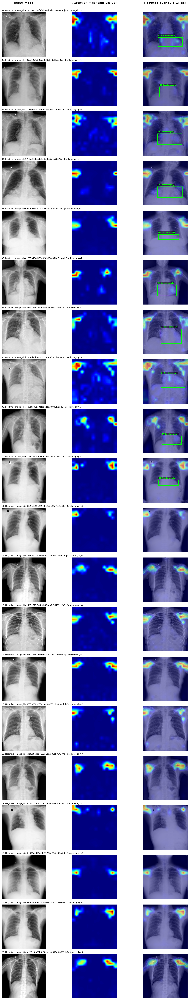

In [15]:
n_cases = len(selected_df)
n_cols = 3

fig_width = 14
fig_height = ROW_HEIGHT * n_cases

fig, axes = plt.subplots(
    nrows=n_cases,
    ncols=n_cols,
    figsize=(fig_width, fig_height),
    dpi=FIG_DPI,
)

if n_cases == 1:
    axes = np.expand_dims(axes, axis=0)


for i, (_, row) in enumerate(selected_df.iterrows()):
    image_id = str(row["image_id"])
    label_value = row[TARGET_LABEL]
    case_type = row["case_type"]
    pt_path = row["heatmap_path"]

    # -------------------------
    # Load input image
    # -------------------------
    img_pil = load_image(
        image_id=image_id,
        images_root=IMAGES_ROOT,
        view_type=VIEW_TYPE,
        mask_root=MASK_ROOT,
    )

    img_np = np.asarray(img_pil).astype(np.float32) / 255.0

    image_width, image_height = img_pil.size

    # -------------------------
    # Load attention map
    # -------------------------
    cam, finding_info, heatmap_metadata = load_cam_from_pt(
        pt_path,
        target_label=TARGET_LABEL,
        cam_key=CAM_KEY,
    )

    cam_resized = resize_cam_to_image(
        cam,
        img_pil.size,
    )

    # -------------------------
    # Create heatmap overlay
    # -------------------------
    overlay = make_overlay(
        rgb_img=img_np,
        cam_norm=cam_resized,
        alpha=0.45,
        cmap_name="jet",
    )

    # -------------------------
    # Retrieve GT boxes
    # Only for positive samples
    # -------------------------
    if case_type == "Positive":
        gt_boxes, scaling_info = get_scaled_gt_boxes(
            image_id=image_id,
            box_annotations_df=box_annotations_df,
            meta_lookup=meta_lookup,
            displayed_width=image_width,
            displayed_height=image_height,
            class_name=TARGET_LABEL,
        )
    else:
        gt_boxes = []
        scaling_info = None

    # ==================================================
    # Column 1: Original input image
    # ==================================================
    axes[i, 0].imshow(img_np)
    axes[i, 0].axis("off")

    row_title = (
        f"{i + 1:02d}. {case_type} | "
        f"image_id={image_id} | "
        f"{TARGET_LABEL}={label_value}"
    )

    axes[i, 0].set_title(
        row_title,
        fontsize=9,
        loc="left",
    )

    # ==================================================
    # Column 2: Attention map
    # ==================================================
    axes[i, 1].imshow(
        cam_resized,
        cmap="jet",
        vmin=0,
        vmax=1,
    )
    axes[i, 1].axis("off")

    # ==================================================
    # Column 3: Heatmap overlay + GT box
    # ==================================================
    axes[i, 2].imshow(overlay)

    if case_type == "Positive":
        draw_gt_boxes(
            ax=axes[i, 2],
            boxes=gt_boxes,
            image_width=image_width,
            image_height=image_height,
            linewidth=2.5,
            class_name=TARGET_LABEL
        )

        if len(gt_boxes) == 0:
            axes[i, 2].text(
                0.02,
                0.97,
                "Positive label, but no GT box found",
                transform=axes[i, 2].transAxes,
                ha="left",
                va="top",
                fontsize=8,
                color="yellow",
                bbox={
                    "facecolor": "black",
                    "alpha": 0.65,
                    "edgecolor": "none",
                },
            )

    axes[i, 2].axis("off")


# -------------------------
# Column headings
# -------------------------
axes[0, 0].text(
    0.5,
    1.18,
    "Input image",
    transform=axes[0, 0].transAxes,
    ha="center",
    va="bottom",
    fontsize=13,
    fontweight="bold",
)

axes[0, 1].text(
    0.5,
    1.18,
    f"Attention map ({CAM_KEY})",
    transform=axes[0, 1].transAxes,
    ha="center",
    va="bottom",
    fontsize=13,
    fontweight="bold",
)

axes[0, 2].text(
    0.5,
    1.18,
    "Heatmap overlay + GT box",
    transform=axes[0, 2].transAxes,
    ha="center",
    va="bottom",
    fontsize=13,
    fontweight="bold",
)

plt.tight_layout()

In [ ]:
OUTPUT_PNG = Path(
    "/home/vault/iwi5/iwi5362h/results/multiview/visualization/original/"
    "cardiomegaly_10pos_10neg_attention_grid_with_bounding_box.png"
)

# Create only the parent directory
OUTPUT_PNG.parent.mkdir(parents=True, exist_ok=True)

In [ ]:
if SAVE_PNG:
    fig.savefig(OUTPUT_PNG, bbox_inches="tight", dpi=FIG_DPI)
    print(f"Saved PNG to: {OUTPUT_PNG}")

if SAVE_SELECTED_CSV:
    selected_df[["image_id", TARGET_LABEL, "case_type", "heatmap_path"]].to_csv(
        SELECTED_CSV, index=False
    )
    print(f"Saved selected cases CSV to: {SELECTED_CSV}")